# Segment satellite images

The purpose of this notebook is to show how SAMGeo (Segment anything for geospatial data) model (https://samgeo.gishub.org/) can be used to segment satellite images. The SAMGeo model is an adaptation of the Meta AI Segment Anything model (https://github.com/facebookresearch/segment-anything) to easy its use over geospatial data. 

In [21]:
# import libraries

In [32]:
import os
import torch
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

In [23]:
# interactive plotting

In [24]:
m = leafmap.Map(center=[41.8902, 12.4922], zoom=17, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[41.8902, 12.4922], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zo…

In [25]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [12.4822, 41.8802, 12.5022, 41.9002]

In [26]:
bbox

[12.4822, 41.8802, 12.5022, 41.9002]

In [27]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=17, source="Satellite", overwrite=True)

Downloaded image 1/80
Downloaded image 2/80
Downloaded image 3/80
Downloaded image 4/80
Downloaded image 5/80
Downloaded image 6/80
Downloaded image 7/80
Downloaded image 8/80
Downloaded image 9/80
Downloaded image 10/80
Downloaded image 11/80
Downloaded image 12/80
Downloaded image 13/80
Downloaded image 14/80
Downloaded image 15/80
Downloaded image 16/80
Downloaded image 17/80
Downloaded image 18/80
Downloaded image 19/80
Downloaded image 20/80
Downloaded image 21/80
Downloaded image 22/80
Downloaded image 23/80
Downloaded image 24/80
Downloaded image 25/80
Downloaded image 26/80
Downloaded image 27/80
Downloaded image 28/80
Downloaded image 29/80
Downloaded image 30/80
Downloaded image 31/80
Downloaded image 32/80
Downloaded image 33/80
Downloaded image 34/80
Downloaded image 35/80
Downloaded image 36/80
Downloaded image 37/80
Downloaded image 38/80
Downloaded image 39/80
Downloaded image 40/80
Downloaded image 41/80
Downloaded image 42/80
Downloaded image 43/80
Downloaded image 44/

Exception: Deleting satellite.tif failed:
Permission denied

In [28]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=12470136.0, center=[41.8902, 12.4922], controls=(ZoomControl(options=['position', 'zoom_in_text', '…

Different checkpoints for the trained SamModel are available and can be found in the original project https://github.com/facebookresearch/segment-anything#model-checkpoints

In this notebook I've already downloaded the model sam_vit_h_4b8939.pth. If the checkpoint is not found the model h checkpoint will be downladed.

In [29]:
checkpoint = os.path.join("checkpoint", "sam_vit_h_4b8939.pth")

In [30]:
# This cell may need several minutes to run
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    sam_kwargs=None,
)

# Generate masks

In [11]:
# Generate masks for the input image. Generated masks are stored on the disk.
sam.generate(image, output="masks.tif", foreground=True, unique=True)

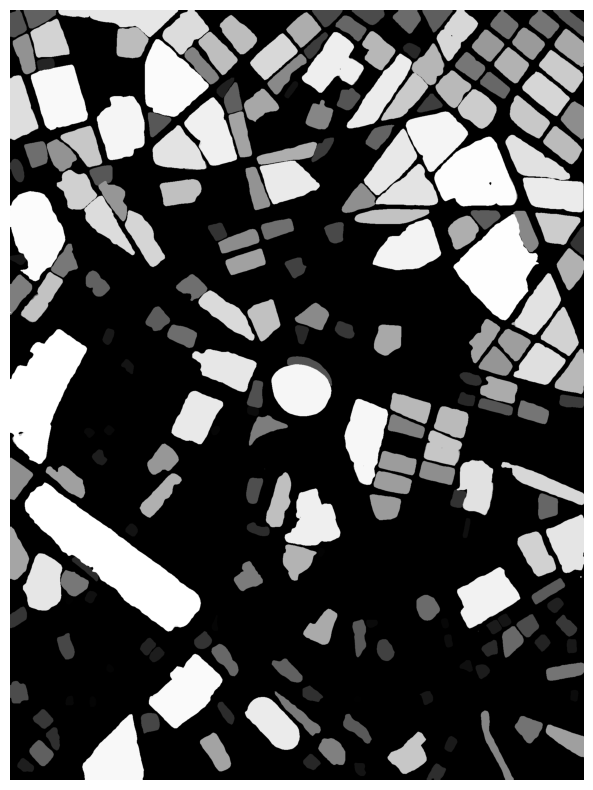

In [12]:
# show mask calculated previosly with unique values
sam.show_masks(cmap="binary_r")

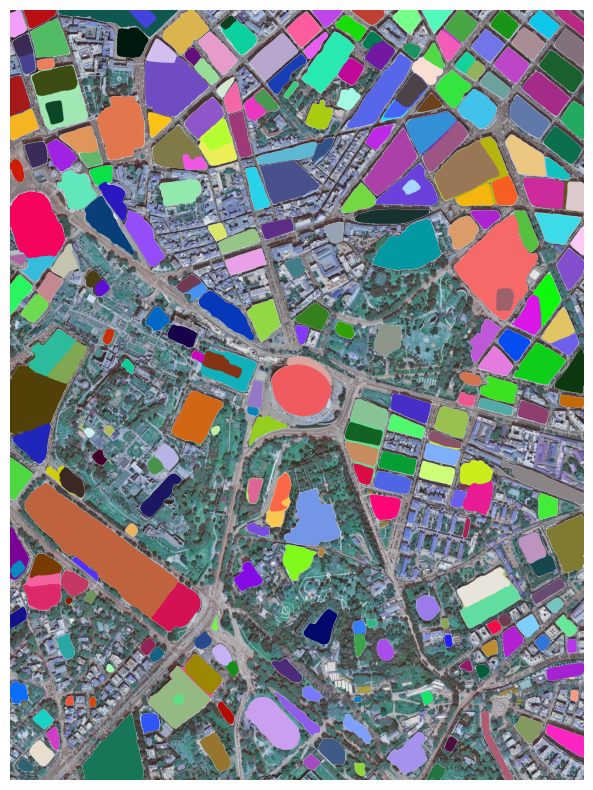

In [13]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")


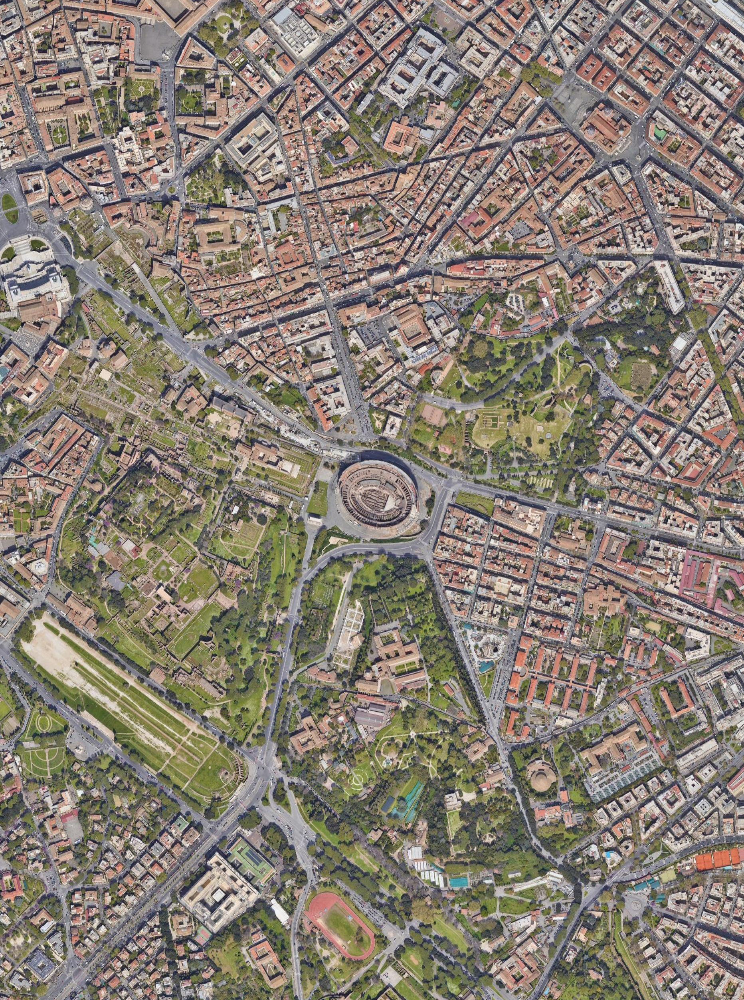
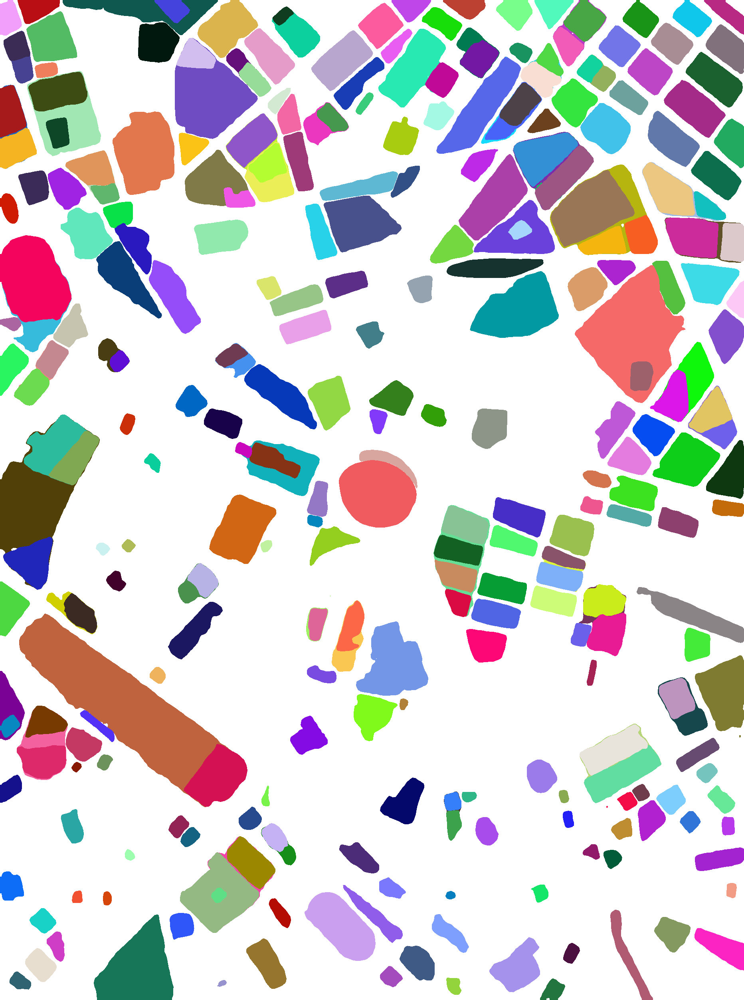

In [14]:
# compare images (sometimes this cell may not work, in that case you need to restart the kernel)
leafmap.image_comparison(
    "satellite.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

In [15]:
# overlap generated mask (with random colors) with the basemap
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=12470136.0, center=[41.89019999999999, 12.4922], controls=(ZoomControl(options=['position', 'zoom_i…

In [16]:
# convert masks to vector format
sam.tiff_to_vector("masks.tif", "masks.gpkg")

In [17]:
# several parameters can be assed to the SamGeo model, here there's an example
# further information for each param can be found there https://github.com/facebookresearch/segment-anything/blob/main/segment_anything/automatic_mask_generator.py#L35

In [18]:
sam_kwargs = {
    "points_per_side": 64, 
    "pred_iou_thresh": 0.9,
    "stability_score_thresh": 0.90,
    "crop_n_layers": 2,
    "crop_n_points_downscale_factor": 3,
    "min_mask_region_area": 90,
}

In [19]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    sam_kwargs=sam_kwargs,
)

In [ ]:
# Uncomment next cells to repeat the mask generatn

In [ ]:
#sam.generate(image, output="masks2.tif", foreground=True)

In [ ]:
#sam.show_masks(cmap="binary_r")

In [ ]:
#sam.show_anns(axis="off", opacity=1, output="annotations2.tif")

In [ ]:
#leafmap.image_comparison(
#    "satellite.tif",
#    "annotations.tif",
#    label1="Satellite Image",
#    label2="Image Segmentation",
#)

In [ ]:
#overlay_images(image, "annotations2.tif", backend="TkAgg")